In [1]:
## create potential cold wake mask
## 600 km on one side and 100km in the other depending on hemisphere
## using chelle's routine

In [279]:
import sys
import os
import pandas as pd
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib as mpl
import datetime
import geopy.distance
from scipy import interpolate
from math import sin, pi

storm: 2013055
getting data
calculating distance and position
generating mask
saving file


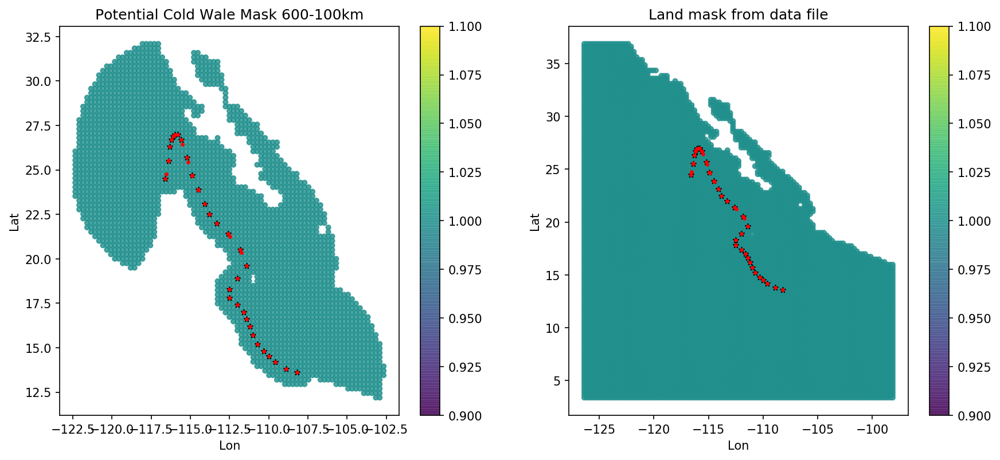

storm: 2013038
getting data
calculating distance and position
generating mask
saving file


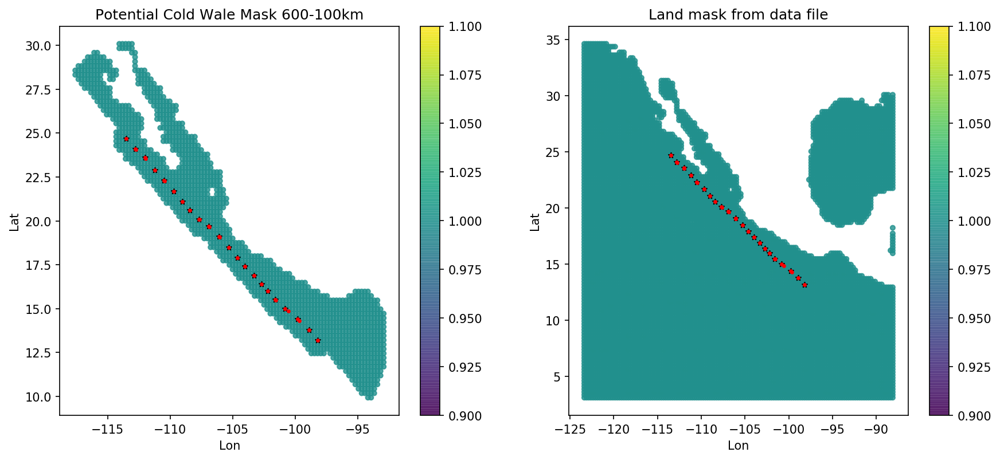

storm: 2007039
getting data
calculating distance and position
generating mask
saving file


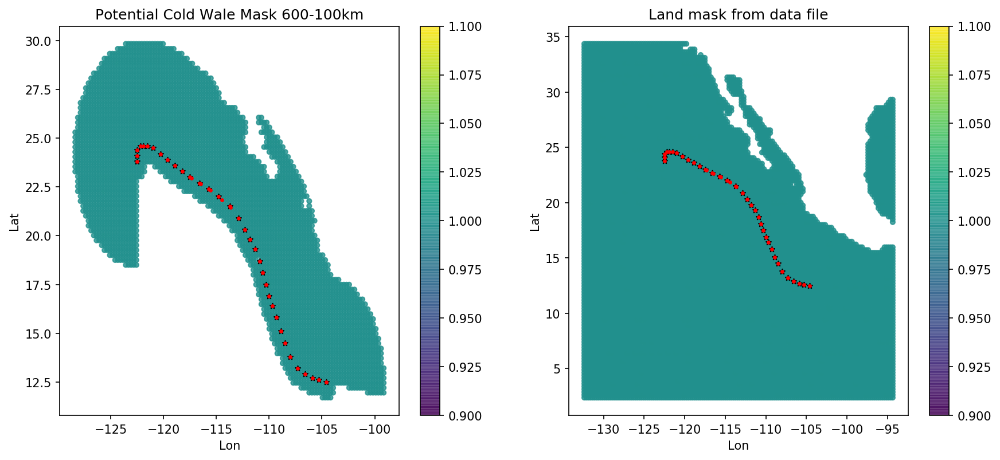

storm: 2014072
getting data
calculating distance and position
generating mask
saving file


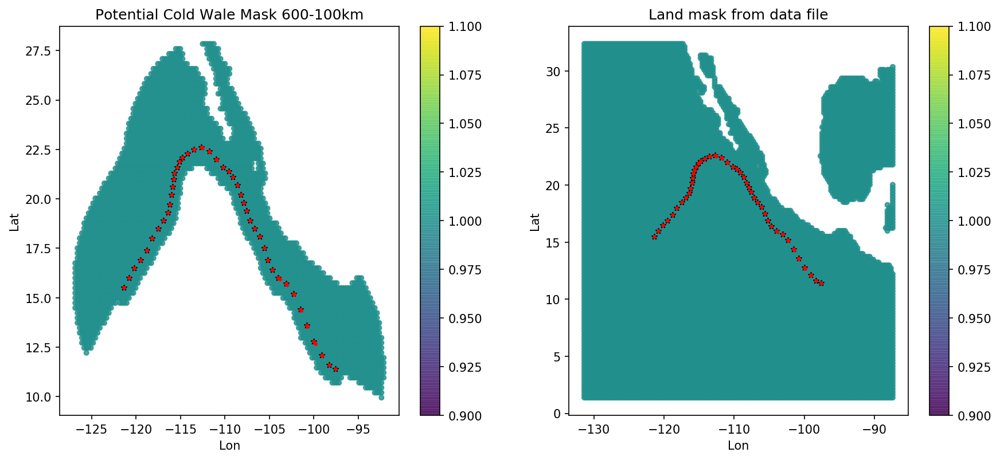

storm: 2014086
getting data
calculating distance and position
generating mask
saving file


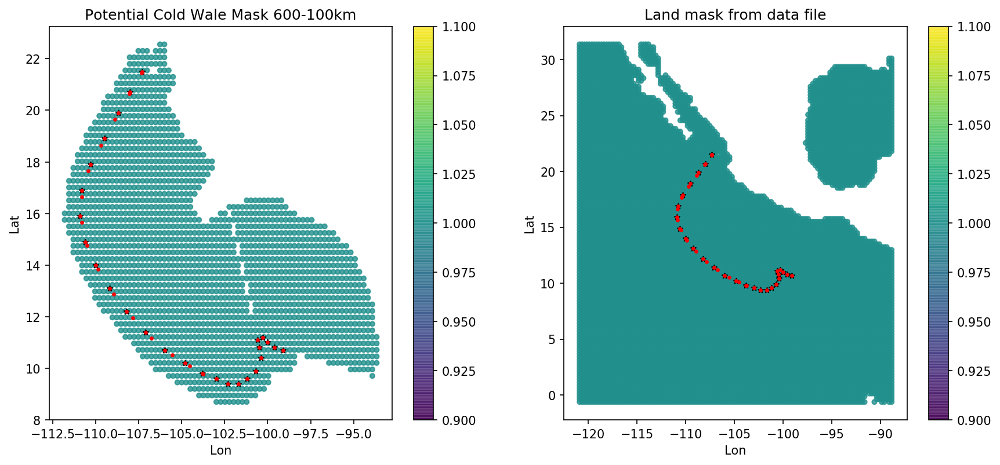

storm: 2005088
getting data
calculating distance and position
generating mask
saving file


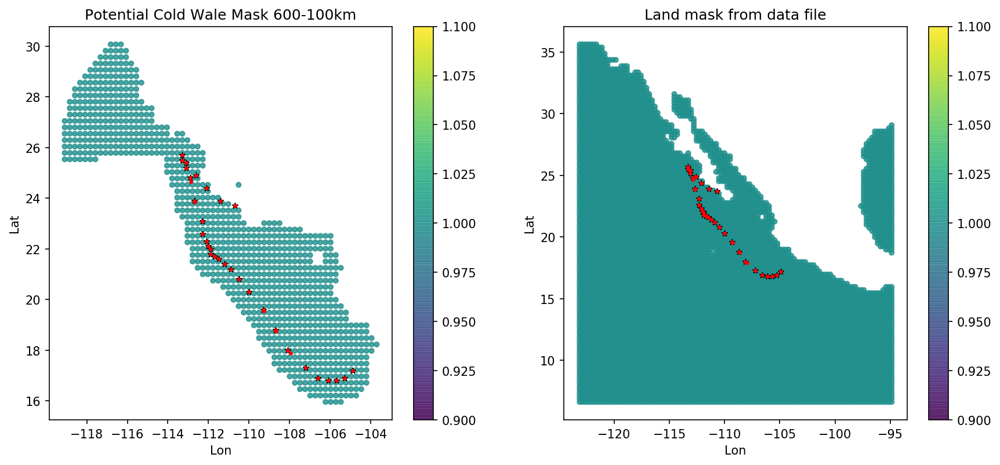

storm: 2006055
getting data
calculating distance and position
generating mask
saving file


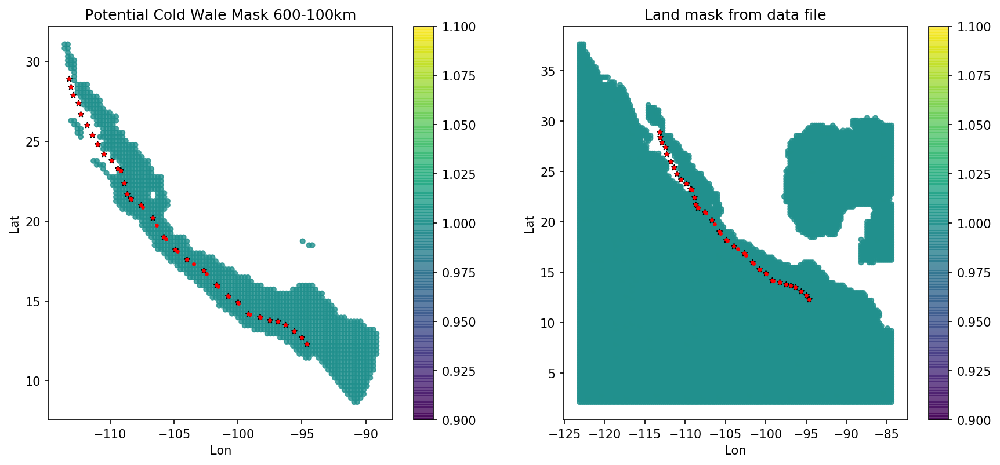

storm: 2005086
getting data
calculating distance and position
generating mask
saving file


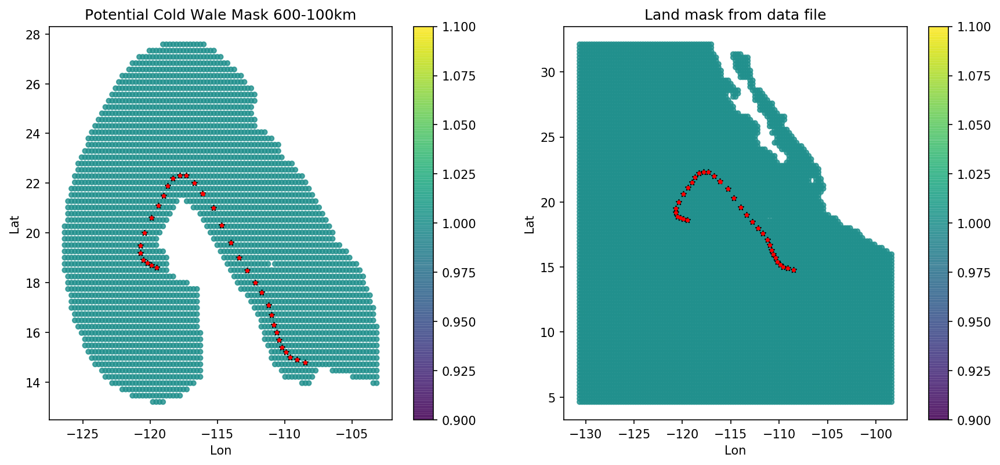

storm: 2006052
getting data
calculating distance and position
generating mask
saving file


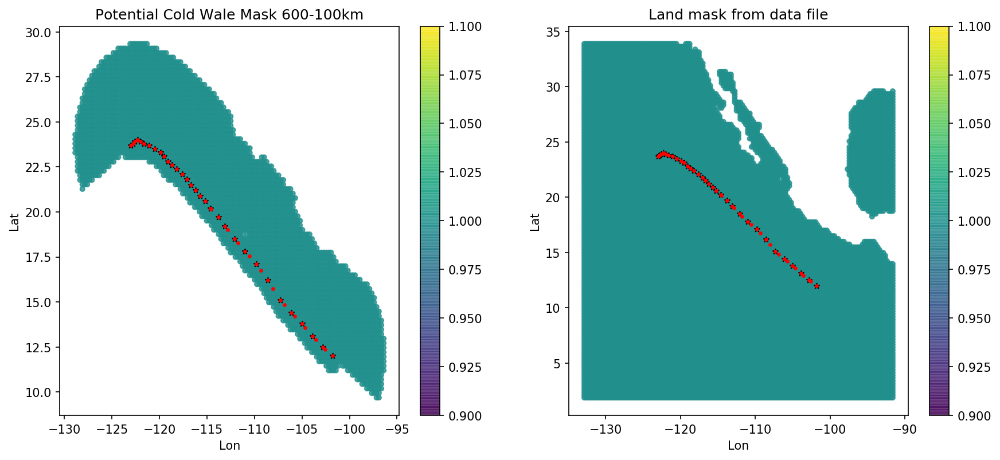

storm: 2012053
getting data
calculating distance and position
generating mask
saving file


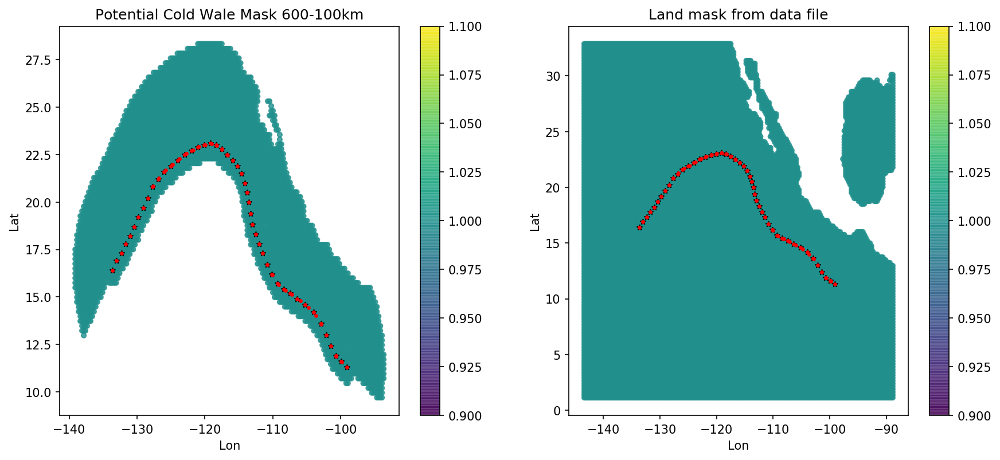

storm: 2006037
getting data
calculating distance and position
generating mask
saving file


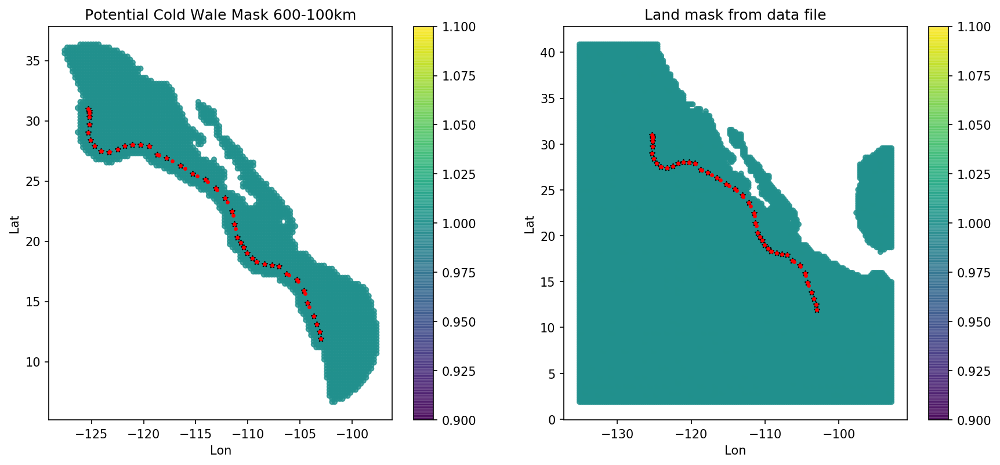

storm: 2006065
getting data
calculating distance and position
generating mask
saving file


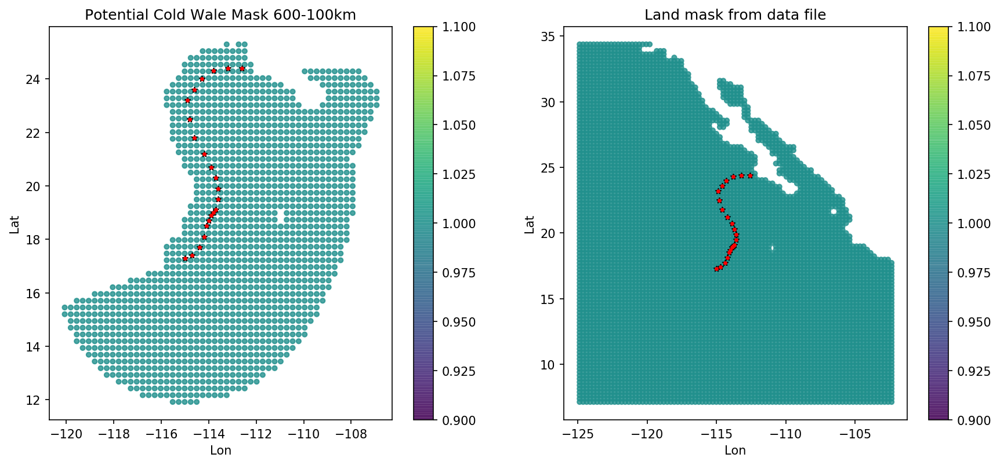

storm: 2012063
getting data
calculating distance and position
generating mask
saving file


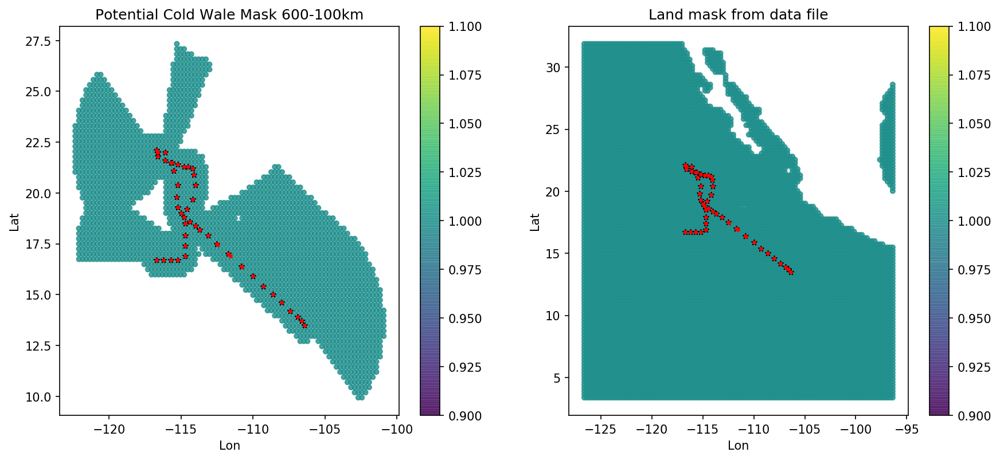

storm: 2009084
getting data
calculating distance and position
generating mask
saving file


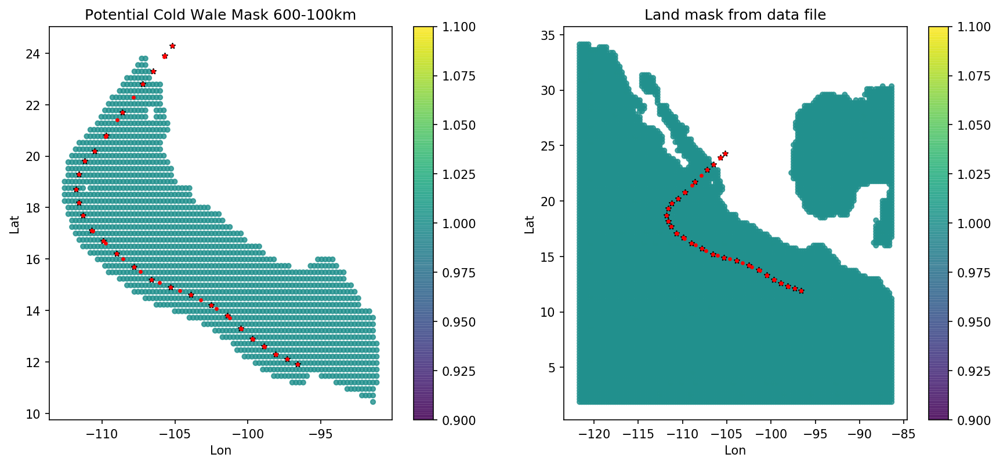

storm: 2015067
getting data
calculating distance and position
generating mask
saving file


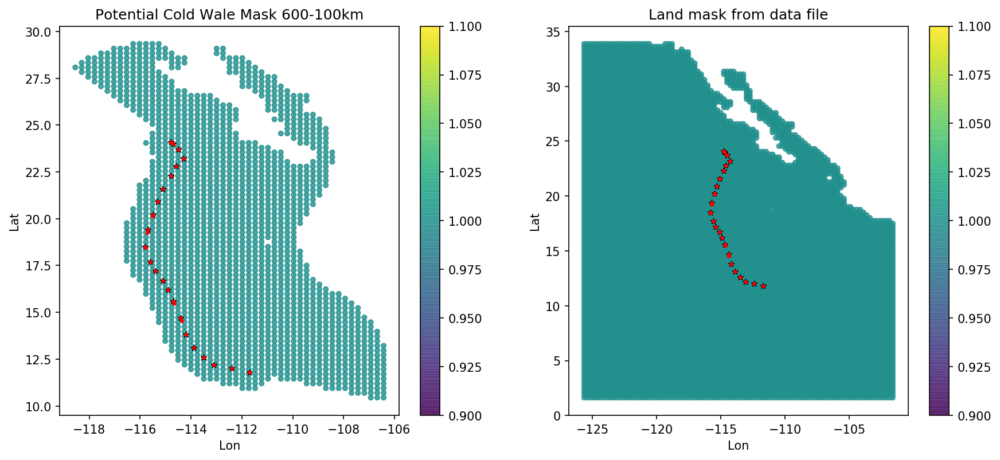

storm: 2015034
getting data
calculating distance and position
generating mask
saving file


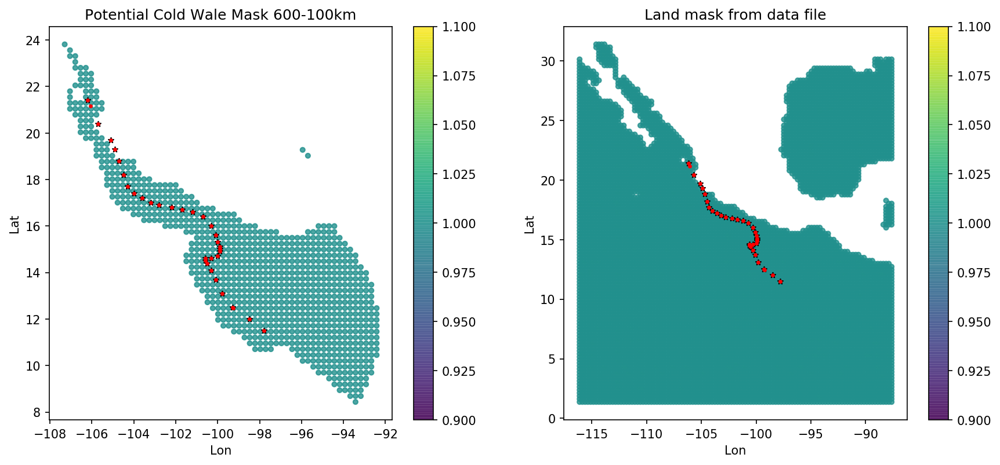

storm: 2012023
getting data
calculating distance and position
generating mask
saving file


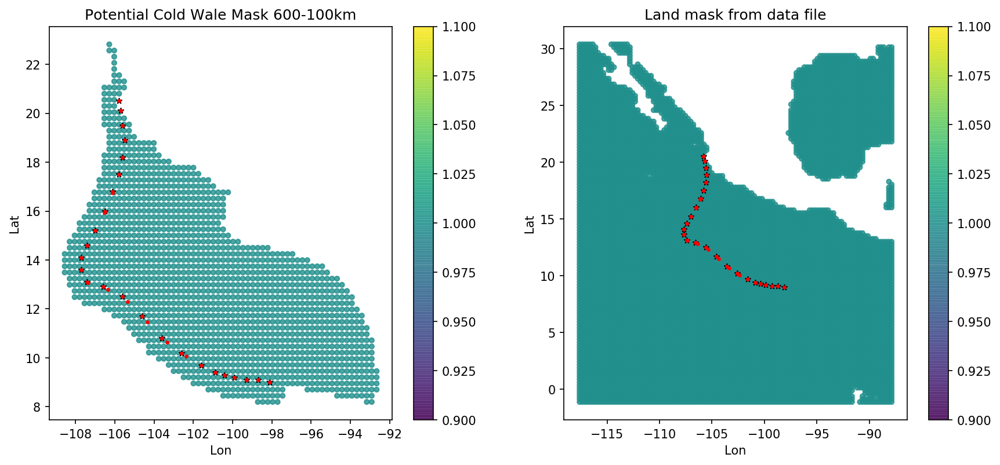

storm: 2009062
getting data
calculating distance and position
generating mask
saving file


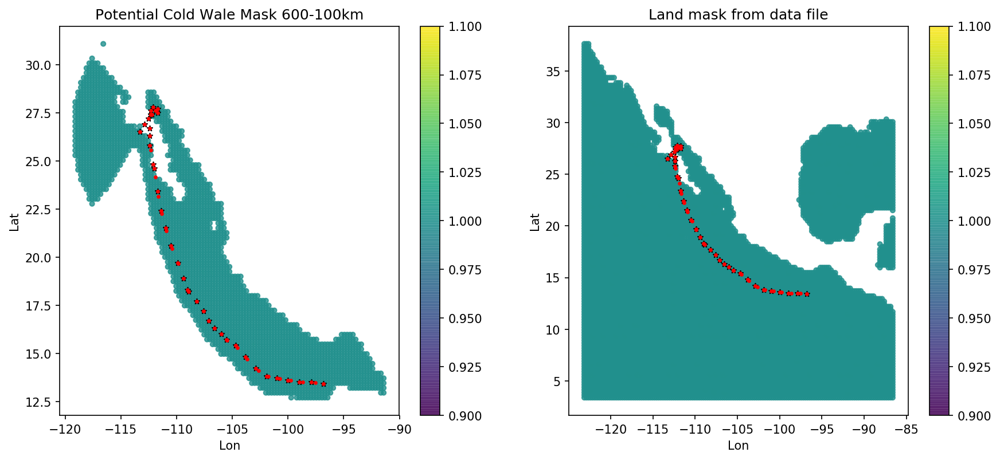

storm: 2015068
getting data
calculating distance and position
generating mask
saving file


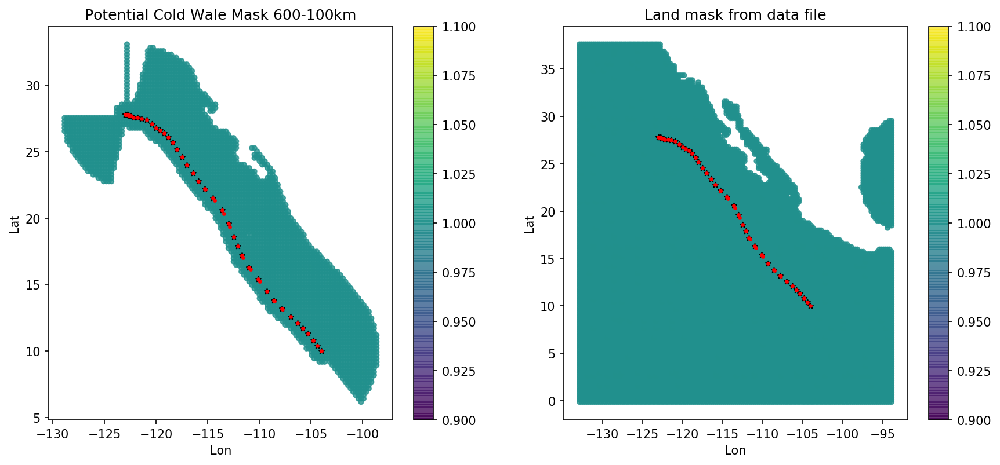

storm: 2015032
getting data
calculating distance and position
generating mask
saving file


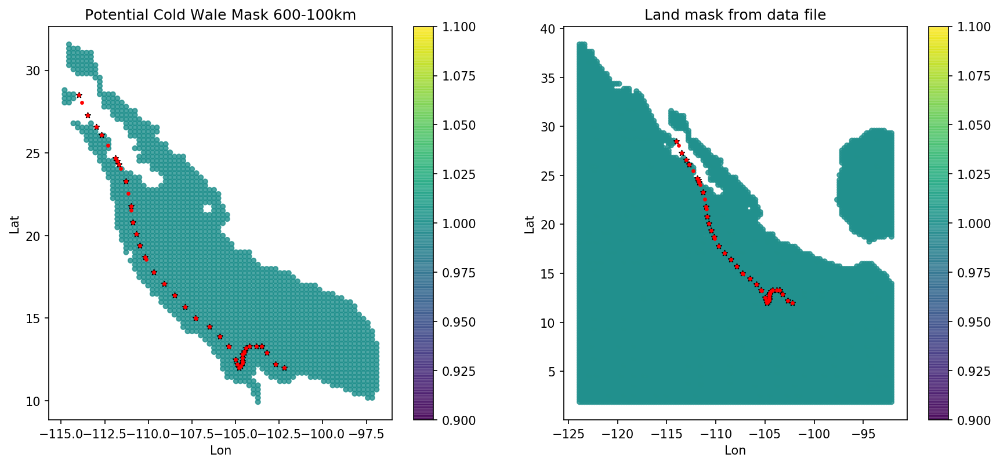

storm: 2006079
getting data
calculating distance and position
generating mask
saving file


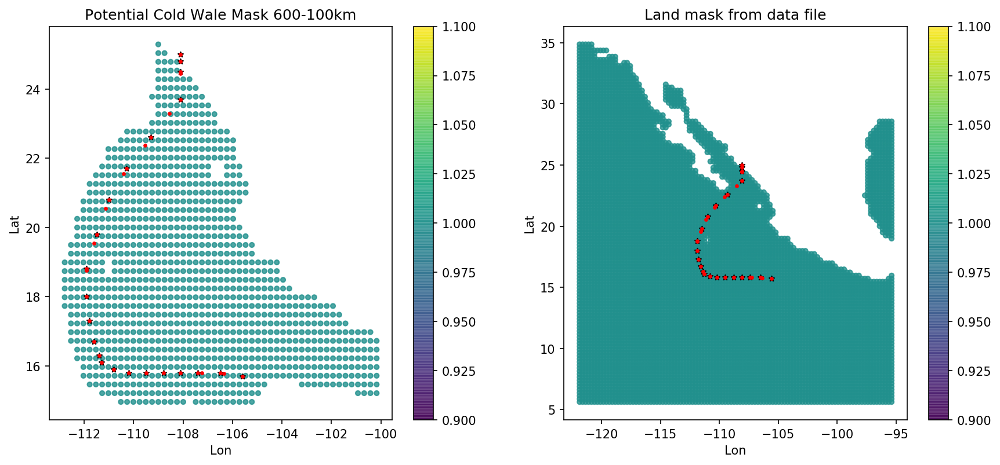

storm: 2008065
getting data
calculating distance and position
generating mask
saving file


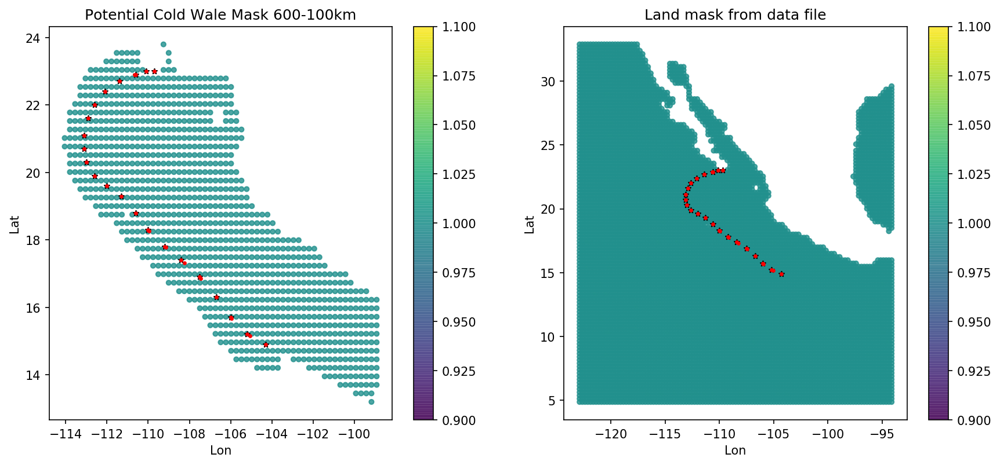

storm: 2014066
getting data
calculating distance and position
generating mask
saving file


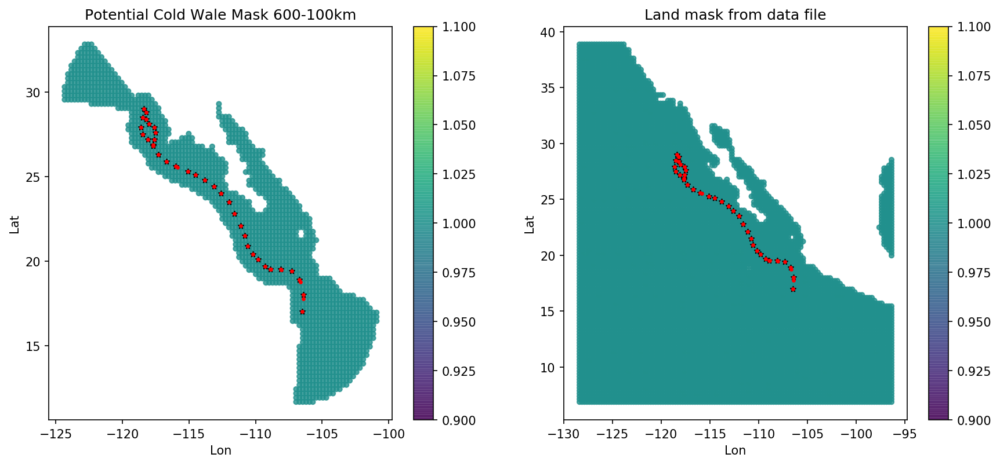

storm: 2014068
getting data
calculating distance and position
generating mask
saving file


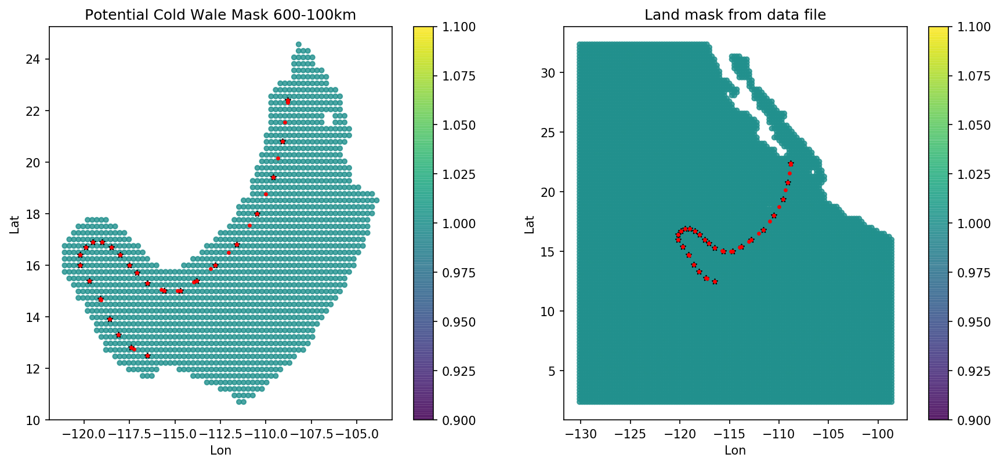

storm: 2004068
getting data
calculating distance and position
generating mask
saving file


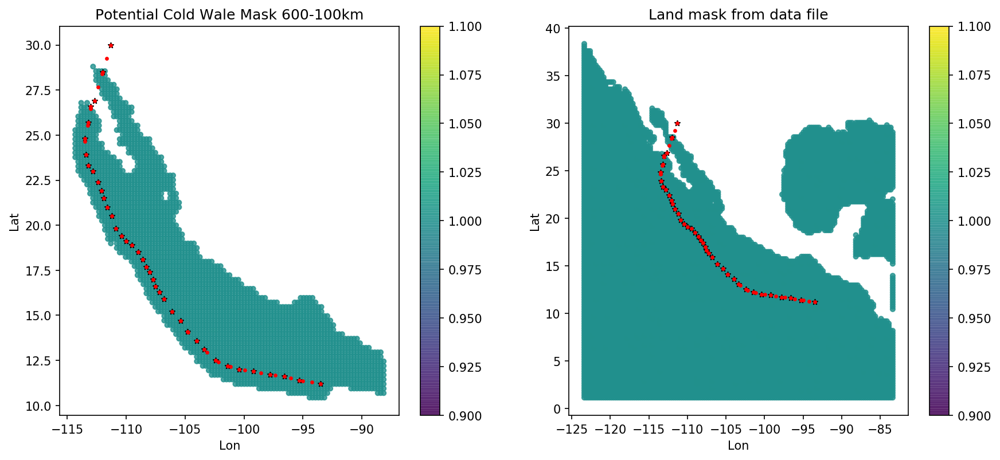

storm: 2014069
getting data
calculating distance and position
generating mask
saving file


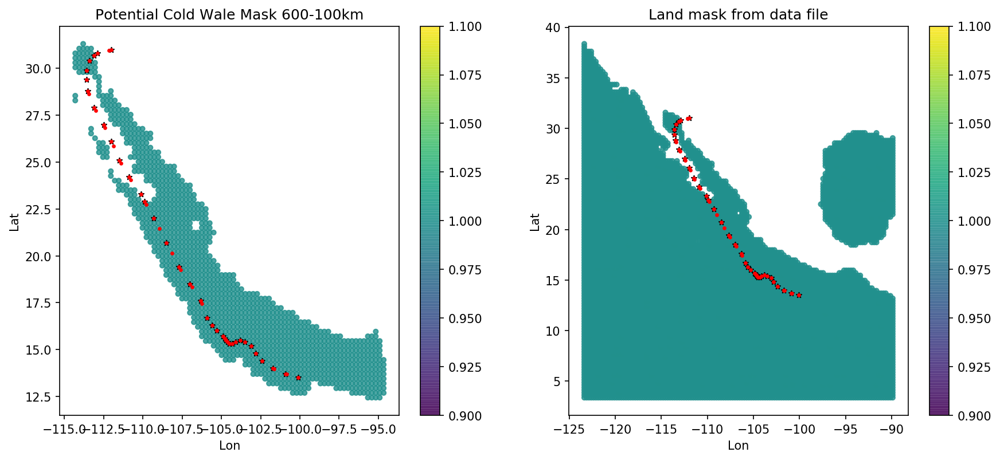

storm: 2004060
getting data
calculating distance and position
generating mask
saving file


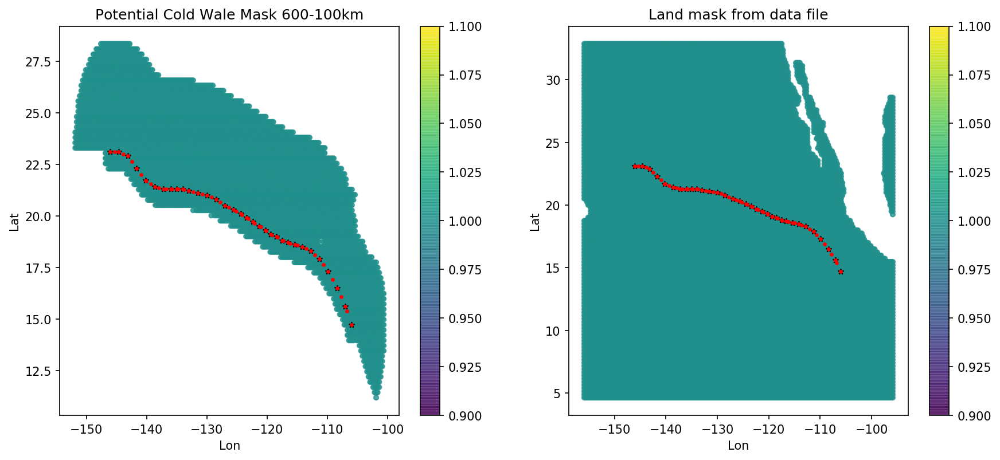

storm: 2010049
getting data
calculating distance and position
generating mask
saving file


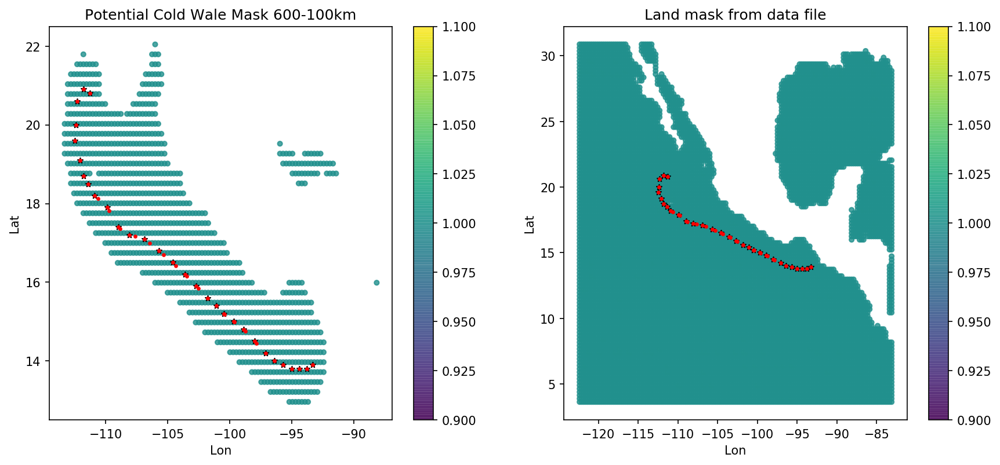

storm: 2013069
getting data
calculating distance and position
generating mask
saving file


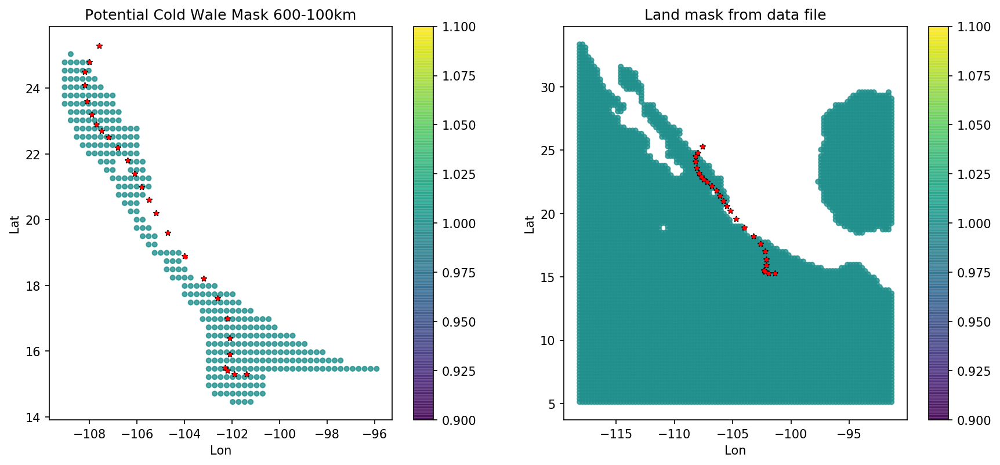

storm: 2014077
getting data
calculating distance and position
generating mask
saving file


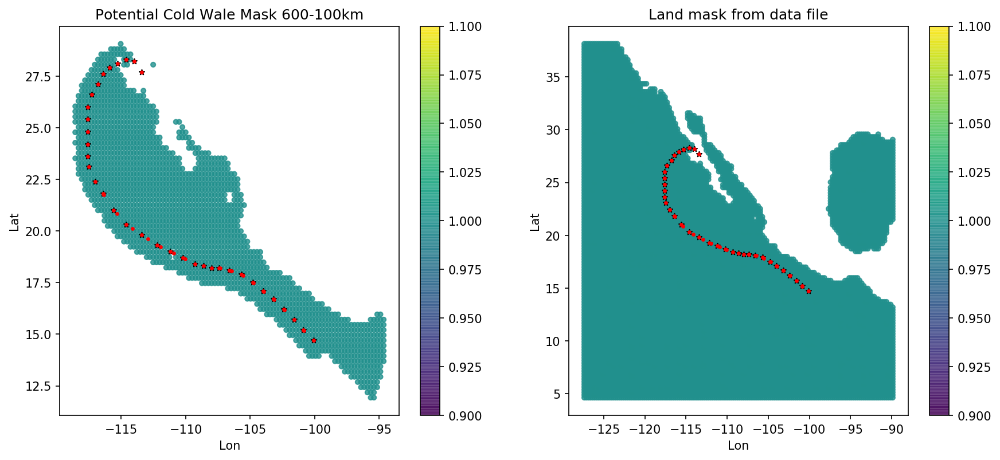

storm: 2007050
getting data
calculating distance and position
generating mask
saving file


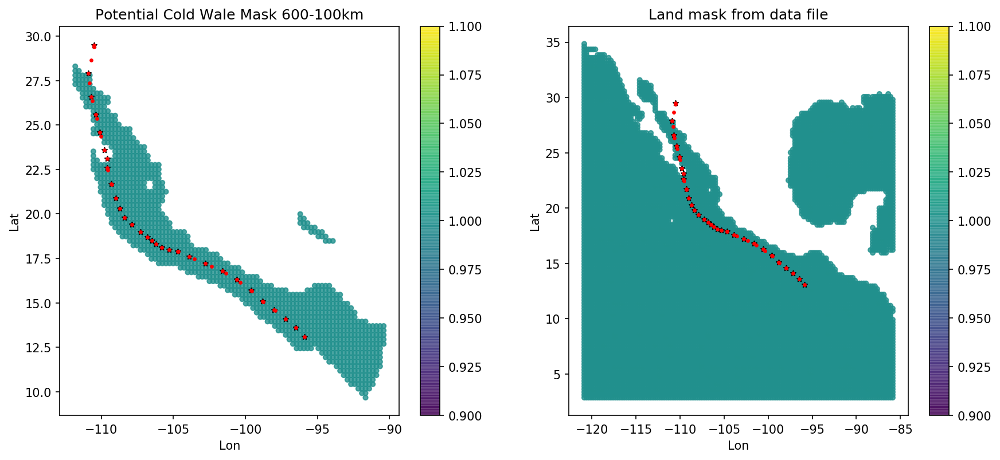

storm: 2007059
getting data
calculating distance and position
generating mask
saving file


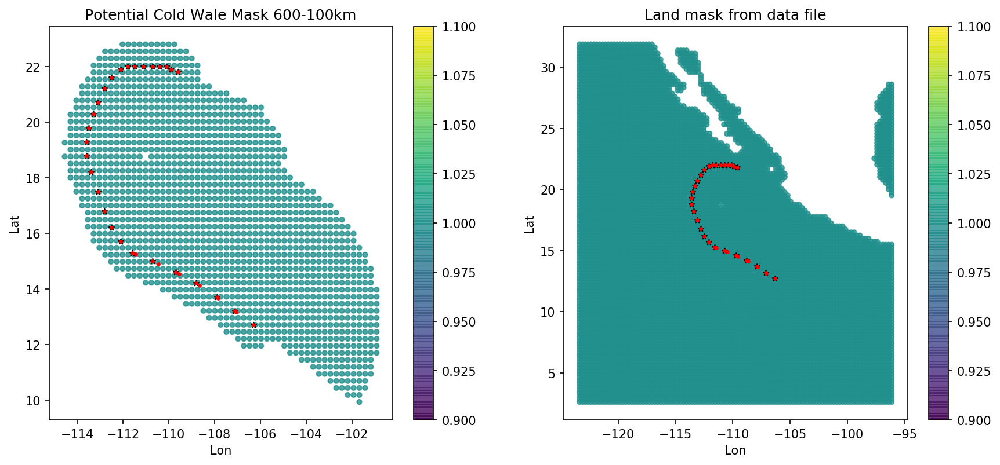

storm: 2008075
getting data
calculating distance and position
generating mask
saving file


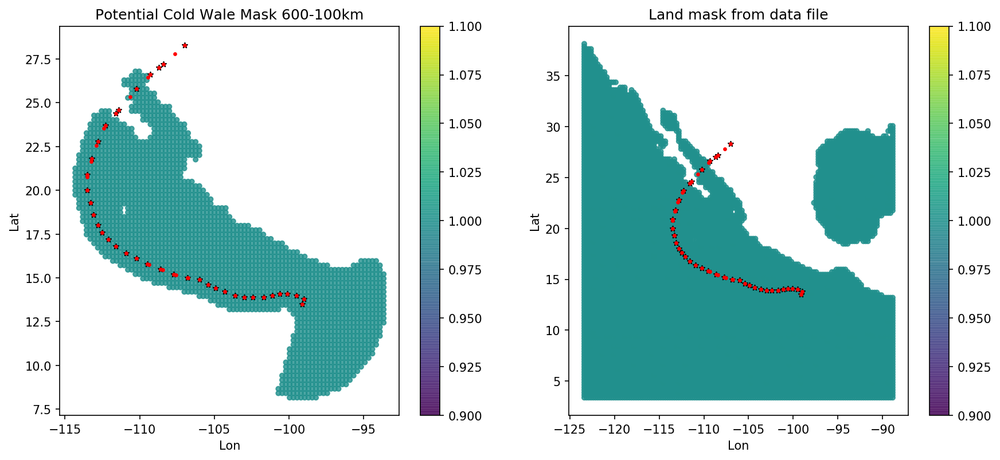

storm: 2013061
getting data
calculating distance and position
generating mask
saving file


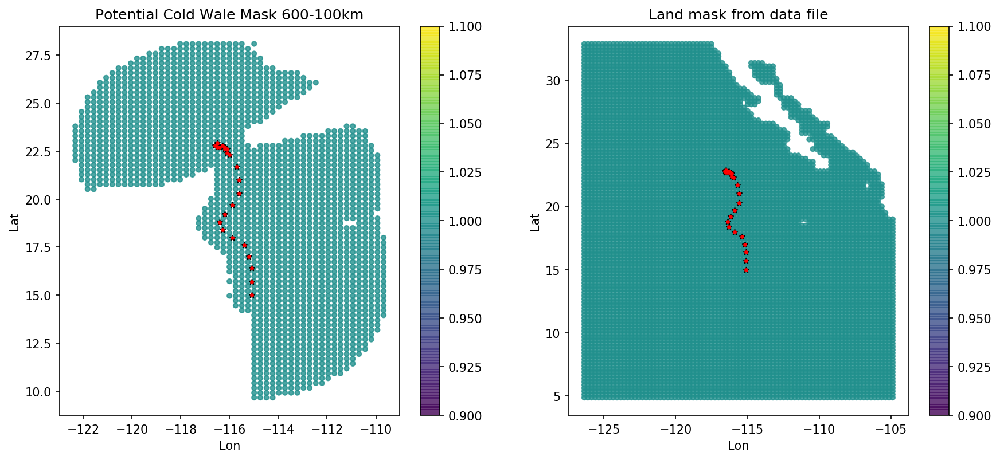

storm: 2008044
getting data
calculating distance and position
generating mask
saving file


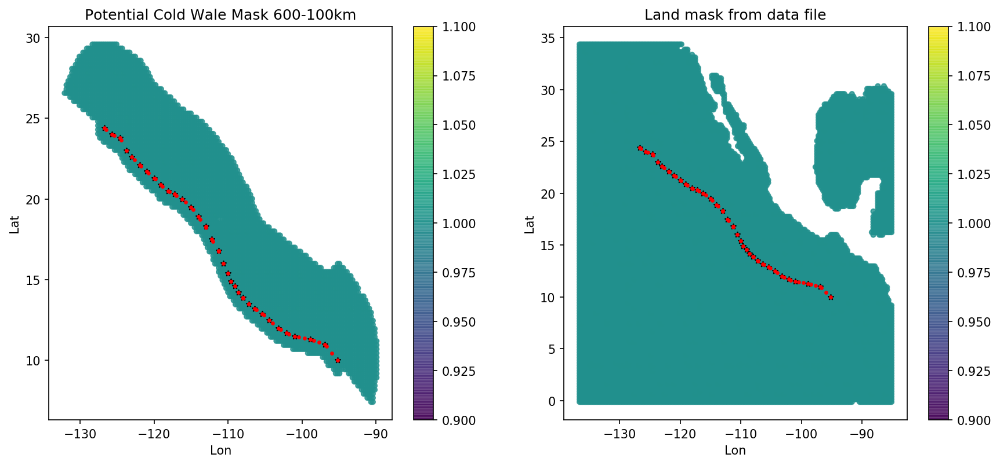

storm: 2007067
getting data
calculating distance and position
generating mask
saving file


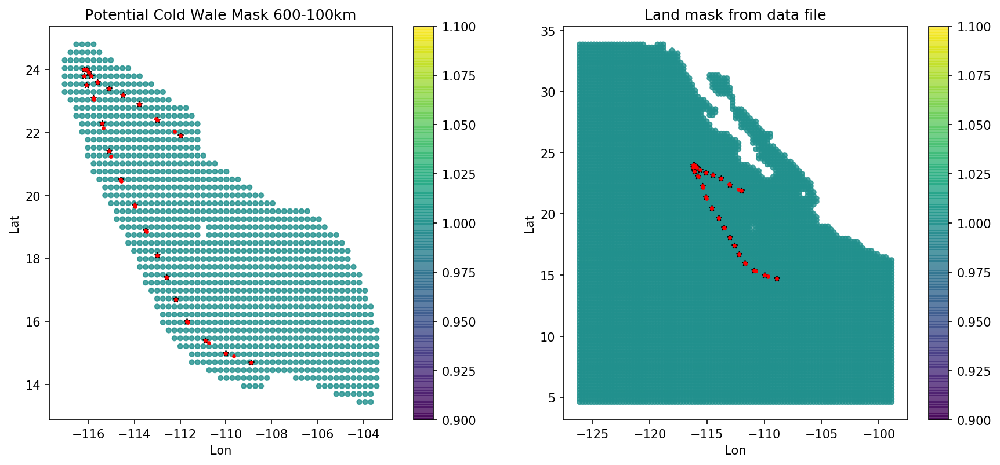

storm: 2009072
getting data
calculating distance and position
generating mask
saving file


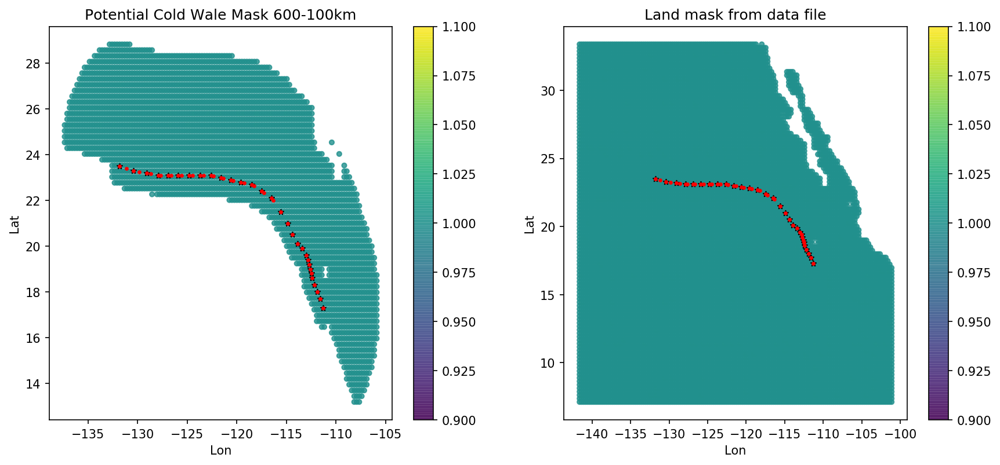

storm: 2012057
getting data
calculating distance and position
generating mask
saving file


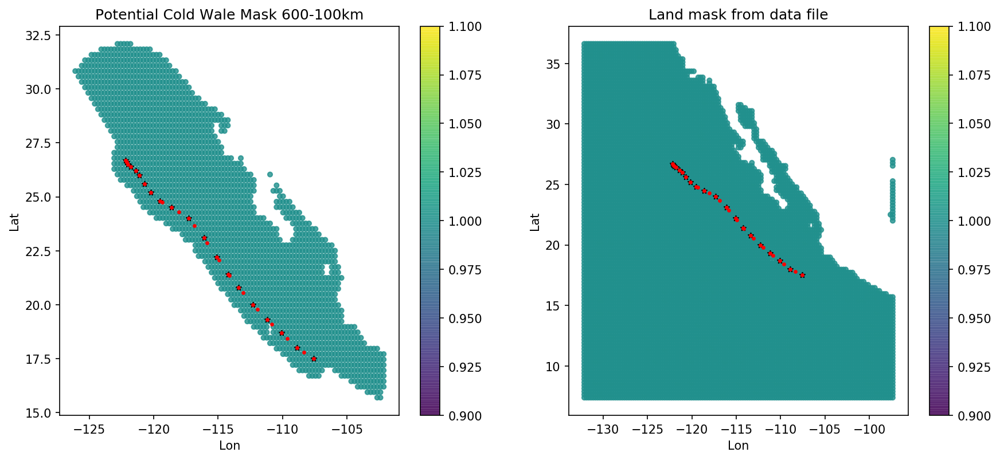

storm: 2015046
getting data
calculating distance and position
generating mask
saving file


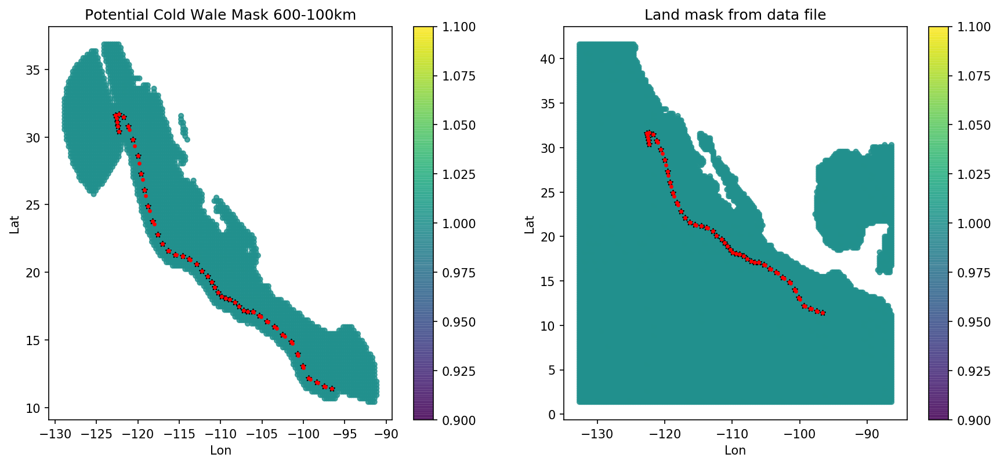

storm: 2012060
getting data
calculating distance and position
generating mask
saving file


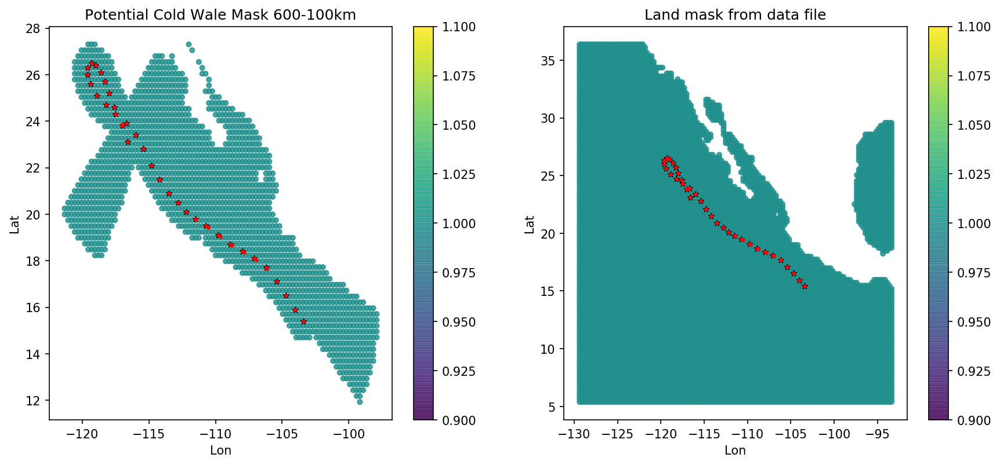

storm: 2005063
getting data
calculating distance and position
generating mask
saving file


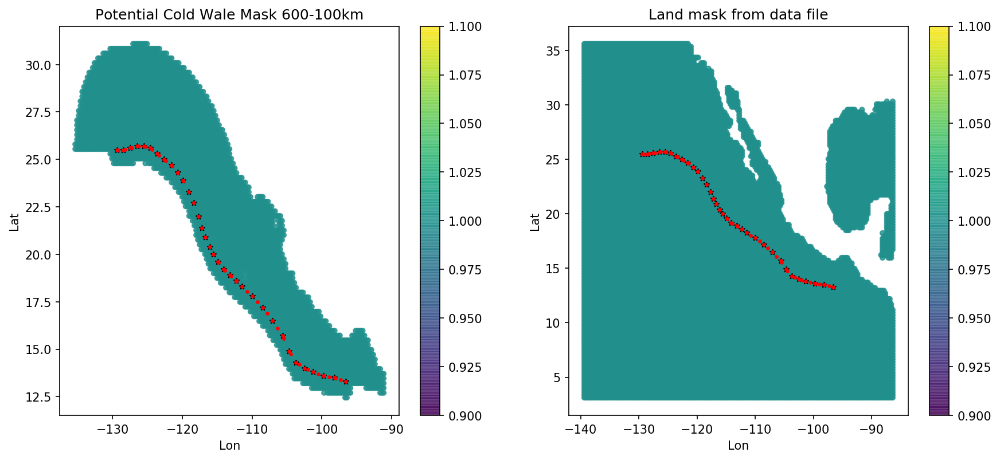

storm: 2011039
getting data
calculating distance and position
generating mask
saving file


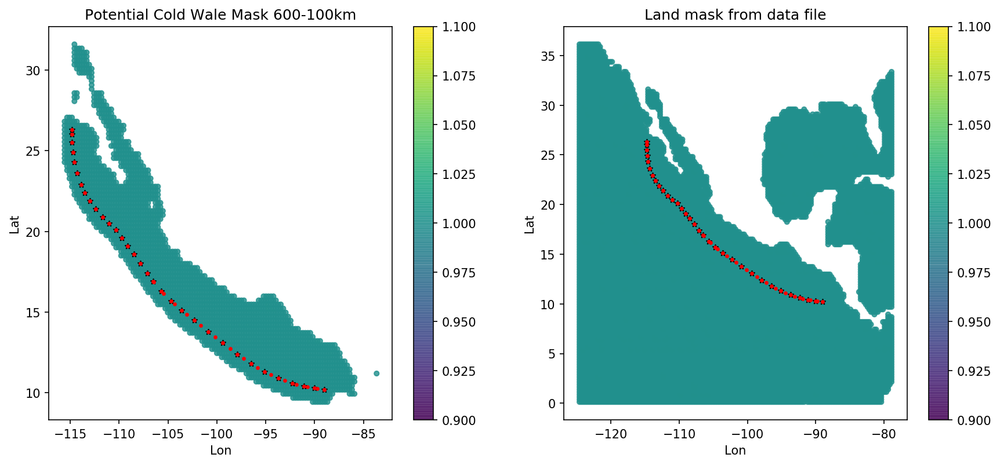

storm: 2005038
getting data
calculating distance and position
generating mask
saving file


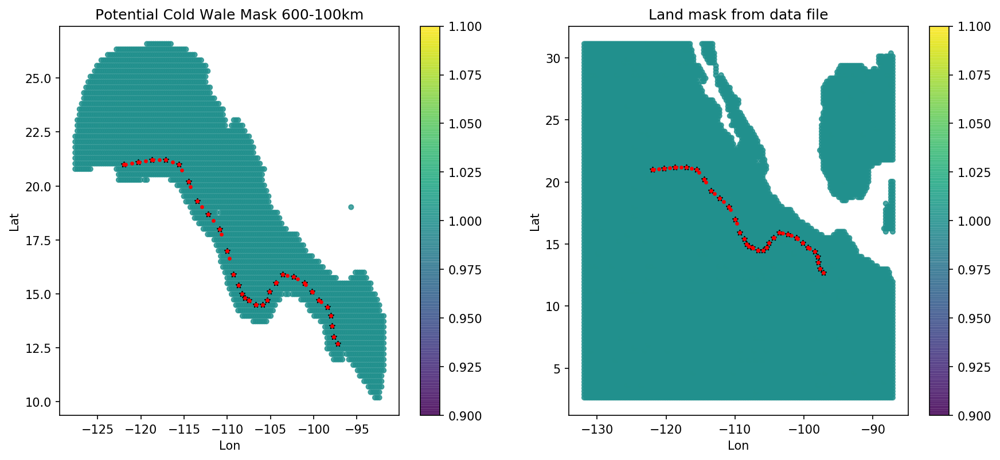

storm: 2015098
getting data
calculating distance and position
generating mask
saving file


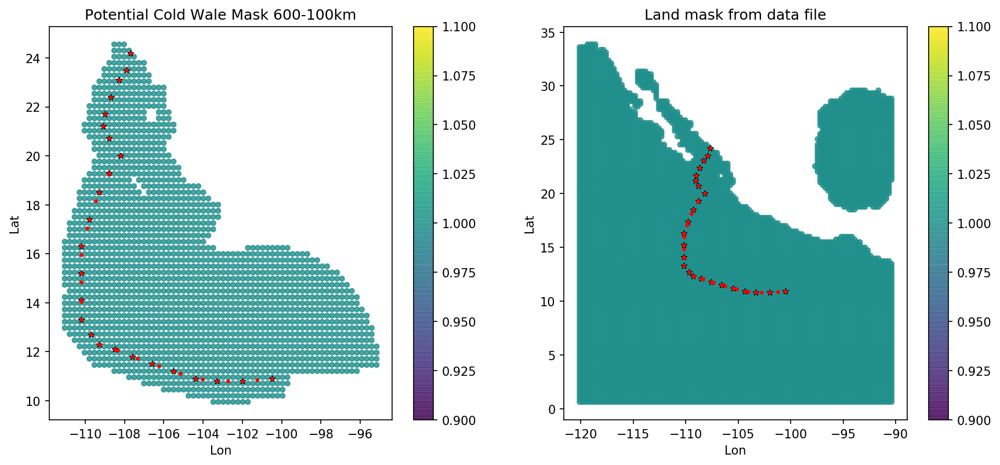

storm: 2014054
getting data
calculating distance and position
generating mask
saving file


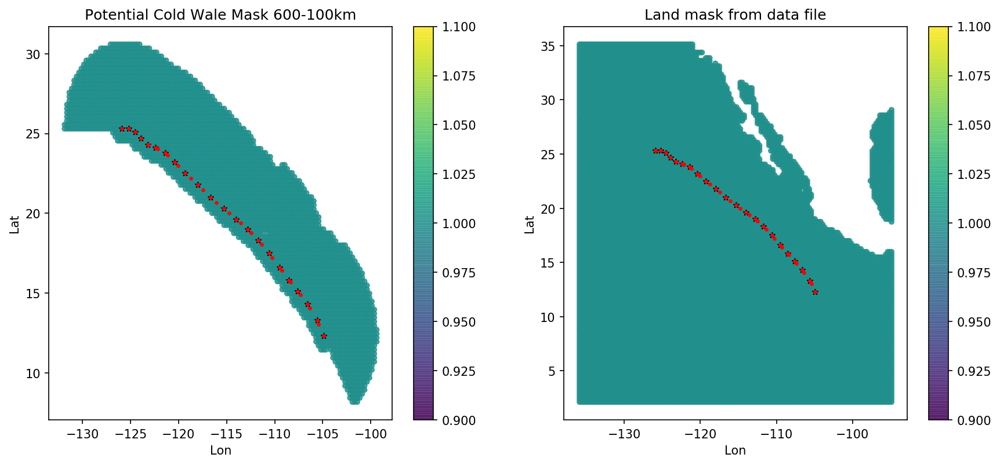

storm: 2004038
getting data
calculating distance and position
generating mask
saving file


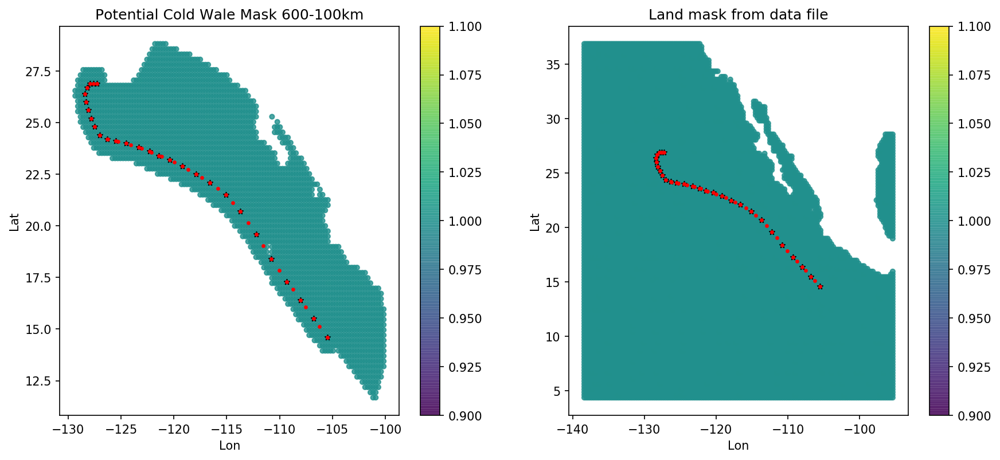

storm: 2004063
getting data
calculating distance and position
generating mask
saving file


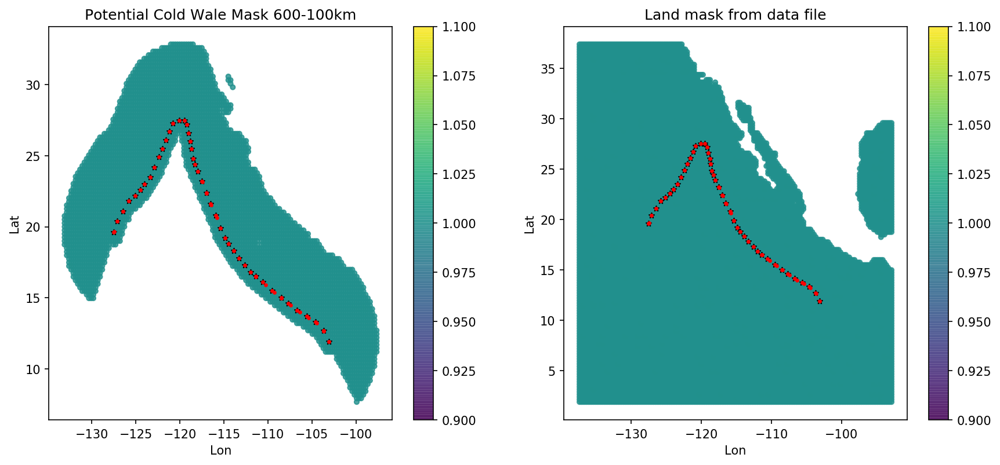

storm: 2014039
getting data
calculating distance and position
generating mask
saving file


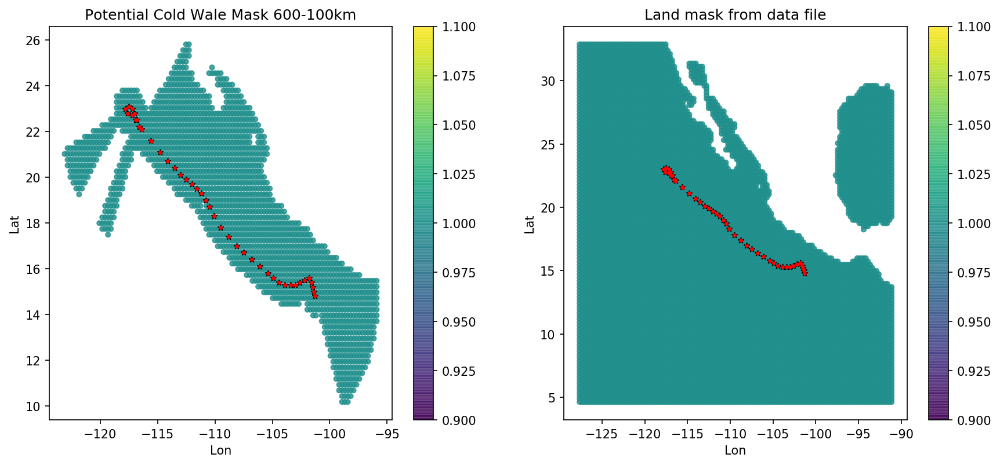

In [278]:
dirfiles='/Users/sol/Documents/LargeData/tc_wakes/storms_Data/'
for root, dirs, files in os.walk(dirfiles, topdown=False):
    l=len(root)
    if l>len(dirfiles):
        # storm to analyze
        strm_id = root[l-7:l]
        stn=strm_id[4:7]
        dir_in=dirfiles+strm_id+'/'

        # calculate and save the potential cold wake mask (600-100km)
        fmask = potential_coldwake_mask(strm_id)
        
        # plot the data --- if needed
        # get storm data (doing it here just to plot)
        storm, storm_date = get_stormtrackdata(strm_id)
        storm_new = interpolate_storm_path(storm)
        stn=strm_id[4:7]
        # open file storm track data
        fn=dir_in+stn+'_combined_data.nc'
        tmp=xr.open_dataset(fn)
        tmp.close()

        plot_mask(strm_id, tmp, fmask, storm, storm_new)


In [ ]:
# plot the data --- if needed
# get storm data (doing it here just to plot)
storm, storm_date = get_stormtrackdata(strm_id)
storm_new = interpolate_storm_path(storm)
stn=strm_id[4:7]
# open file storm track data
fn=dir_in+stn+'_combined_data.nc'
tmp=xr.open_dataset(fn)
tmp.close()

plot_mask(strm_id, tmp, fmask, storm, storm_new)

In [263]:
def potential_coldwake_mask(strm_id):
    
    print('storm: '+strm_id)
    print('getting data')
    # data around storm
    stn=strm_id[4:7]
    fn=dir_in+stn+'_combined_data.nc'
    alldt=xr.open_dataset(fn)
    alldt.close()
    # get storm data (doing it here just to plot)
    storm, storm_date = get_stormtrackdata(strm_id)

    print('calculating distance and position')
    # interpolate storm
    storm_new = interpolate_storm_path(storm)
    
    # calculate minimal distance to storm and position
    min_dist,position = closest_dist(alldt,storm_new)

    print('generating mask')
    # calculate mask 600-100km
    fmask=get_mask_dist600100km(alldt,min_dist,position)

    print('saving file')
    # save
    fo=dir_in+stn+'_potentialcoldwakemask.nc'
    fmask.to_netcdf(path=fo,mode='w')

    return fmask

In [241]:
def get_stormtrackdata(stnyr):
    
    stn=stnyr[4:7]
    # open file storm track data
    fn=dir_in+stn+'annual_storm_info.nc'
    tmp=xr.open_dataset(fn)
    tmp.close()
    # transform storm time to comparable time to data
    date_1858 = datetime.datetime(1858,11,17,0,0,0) # start date is 11/17/1958
    tmp_date=[0]*len(tmp.time.values[0]) 
    for i in range(len(tmp.time.values[0])):
        tmp_date[i]=date_1858+datetime.timedelta(days=float(tmp.time.values[0][i]))  
    # transform storm lon to -180:180
    tmp.lon[0]=[i-360 for i in tmp.lon[0] if i>=180]
    
    return tmp, tmp_date

In [242]:
def interpolate_storm_path(dsx): 
    # c.gentemann 2.18.2019. edited by m.garcia-reyes 2.19.2019
    #after calculating the distance from the storm it became clear that the storm data is every 6 hours, no matter 
    #how much it may have moved.  So if the storm moved 300 km in 6 hr, when calculating the distance to the storm
    #there were points on the storm track that showed large distances because of the separation to the 6hrly storm points
    #this subroutine interpolates the storm path onto a higher spatial resolution
    #the new storm dataset is carefully put into an identical format with i2 and j2 as dims to match the old format
    ynew = []
    tnew = []
    xnew = []
    dsx['lon'] = (dsx.lon-180) % 360 - 180 #put -180 to 180
    for istep in range(1,dsx.lon.shape[1]):
        dif_lat = dsx.lat[0,istep]-dsx.lat[0,istep-1]
        dif_lon = dsx.lon[0,istep]-dsx.lon[0,istep-1]
        x,y,t = dsx.lon[0,istep-1:istep+1].values,dsx.lat[0,istep-1:istep+1].values,dsx.time[0,istep-1:istep+1].values
        x1,y1,t1 = dsx.lon[0,istep-1:istep].values,dsx.lat[0,istep-1:istep].values,dsx.time[0,istep-1:istep].values
        if abs(dif_lat)>abs(dif_lon):
            isign = np.sign(dif_lat)
            if abs(dif_lat)>0.75:
                ynew1 = np.arange(y[0], y[-1], isign.data*0.75)
                f = interpolate.interp1d(y, x, assume_sorted=False)
                xnew1 = f(ynew1)
                f = interpolate.interp1d(y, t, assume_sorted=False)
                tnew1 = f(ynew1)
            else:
                xnew1,ynew1,tnew1 = x1,y1,t1
            xnew,ynew,tnew = np.append(xnew,xnew1),np.append(ynew,ynew1),np.append(tnew,tnew1) 
        else:
            isign = np.sign(dif_lon)
            if abs(dif_lon)>0.75:
                iwrap_interp = 1
                if (x[0]<-90) & (x[-1]>90):
                    iwrap_interp = -1
                    x[0]=x[0]+360
                if (x[0]>90) & (x[-1]<-90):
                    iwrap_interp = -1
                    x[-1]=x[-1]+360
                xnew1 = np.arange(x[0], x[-1], iwrap_interp*isign.data*0.75)
                f = interpolate.interp1d(x, y, assume_sorted=False)
                ynew1 = f(xnew1)
                f = interpolate.interp1d(x, t, assume_sorted=False)
                tnew1 = f(xnew1)
                xnew1 = (xnew1 - 180) % 360 - 180 #put -180 to 180
            else:
                xnew1,ynew1,tnew1 = x1,y1,t1
            xnew,ynew,tnew = np.append(xnew,xnew1),np.append(ynew,ynew1),np.append(tnew,tnew1) 
        
    # mising last 2 points!!! i dont think they are assgined (sol's note)
    # add the last point from original storm as it is not covered by interpolation loop
    xnew,ynew,tnew = np.append(xnew,dsx.lon[0,istep]),np.append(ynew,dsx.lat[0,istep]),np.append(tnew,dsx.time[0,istep]) 

    #remove any repeated points
    ilen=xnew.size
    outputx,outputy,outputt=[],[],[]
    for i in range(ilen-1):
        if (xnew[i]==xnew[i+1]) and (ynew[i]==ynew[i+1]):
            continue
        else:
            outputx,outputy,outputt = np.append(outputx,xnew[i]),np.append(outputy,ynew[i]),np.append(outputt,tnew[i])

    # append last one that wasn't tested by itself (cant) !! sol's modification
    outputx,outputy,outputt = np.append(outputx,xnew[-1]),np.append(outputy,ynew[-1]),np.append(outputt,tnew[-1])

    xnew,ynew,tnew=outputx,outputy,outputt
    
    #put into xarray
    i2,j2=xnew.shape[0],1
    tem = np.expand_dims(xnew, axis=0)
    xx = xr.DataArray(tem.T,dims=['i2','j2'])
    tem = np.expand_dims(ynew, axis=0)
    yy = xr.DataArray(tem.T,dims=['i2','j2'])
    tem = np.expand_dims(tnew, axis=0)
    tt = xr.DataArray(tem.T,dims=['i2','j2'])
    dsx_new = xr.Dataset({'lon':xx.T,'lat':yy.T,'time':tt.T})
    return dsx_new

In [255]:
def closest_dist(ds_in,storm_new): 
    # m.garcia-reyes 2.4.2019, edited c.gentemann 2.4.2019. edited again by m.garcia-reyes 2.19.2019
    # calculate distance closest storm point (2D)
    # initialize distances (in km)
    tdim,xdim,ydim=storm_new.lat.shape[1], ds_in.analysed_sst[0,:,0].shape[0], ds_in.analysed_sst[0,0,:].shape[0]
    dx_save=np.zeros([tdim,xdim,ydim])
    dx_grid,dy_grid = np.meshgrid(ds_in.lon.values,ds_in.lat.values)
    lon_grid,lat_grid = np.meshgrid(ds_in.lon.values,ds_in.lat.values)
    min_dist_save = np.zeros([xdim,ydim])*np.nan
    min_index_save = np.zeros([xdim,ydim])*np.nan
    min_time_save = np.zeros([xdim,ydim])*np.nan

    position = np.zeros([xdim,ydim])*np.nan
    #for each location of the storm calculate the difference for all values in box
    for ipt in range(0,storm_new.lat.shape[1]):  # all storm values
        # send one value of strom and a 2D array for the data shape
        dist_tem_grid = get_dist_grid(storm_new.lat[0,ipt].values,storm_new.lon[0,ipt].values,ds_in.lat.values,ds_in.lon.values)
        dx_save[ipt,:,:]=dist_tem_grid       
    #now go through each value in box and find minimum storm location/day
    for j in range(0,ds_in.lon.shape[0]):
        for i in range(0,ds_in.lat.shape[0]):
            imin = np.argmin(dx_save[:,i,j])
            min_dist_save[i,j]=dx_save[imin,i,j]
            min_index_save[i,j]=imin
            min_time_save[i,j]=storm_new.time[0,imin]
            i1,i2=imin,imin+1
            if i2>=storm_new.lat.shape[1]:
                i1,i2=imin-1,imin
            lonx,laty=ds_in.lon[j],ds_in.lat[i]
    #                sign((Bx - Ax) * (Y - Ay) - (By - Ay) * (X - Ax))
            position[i,j] = np.sign((storm_new.lon[0,i2] - storm_new.lon[0,i1]) * (laty - storm_new.lat[0,i1]) 
                                 - (storm_new.lat[0,i2] - storm_new.lat[0,i1]) * (lonx - storm_new.lon[0,i1]))

    ardist=xr.DataArray(min_dist_save,coords=[ds_in.lat,ds_in.lon],dims=['lat','lon'])
    arpost=xr.DataArray(position,coords=[ds_in.lat,ds_in.lon],dims=['lat','lon'])
    return ardist, arpost

In [244]:
def get_dist_grid(lat_point,lon_point,lat_list,lon_list):
    # adapted from chelle's routine
    # this routine takes a point and finds distance to all points in a "grid" of lat and lon 
    nx,ny = len(lon_list),len(lat_list)
    dist_grid = np.empty((ny,nx))  
    coords_1 = (lat_point, lon_point) 
    for i in range(ny):
        for j in range(nx):
            coords_2 = (lat_list[i], lon_list[j])
            arclen_temp = geopy.distance.geodesic(coords_1, coords_2).km  #distance in km   
            dist_grid[i,j]=arclen_temp
    return dist_grid

In [245]:
def get_mask_dist600100km(tmp, dist, position):
    # calculate mask of 600 km to right/left and 100 to left/right around storm if northern/southern hermisphere
    # based on min dist to storm, not data 
    
    #is storm in southern or northen hemisphere?  -1 values to the right
    pos2sav = -1 # if northern hemisphere, save values to the left up to 600km
    if tmp.lat.max()<0: # if southern hemisphere, save values to the right up to 600km
        pos2sav = 1
    
    
    # use land mask as base (a bit of brute force)
    nmask=tmp.mask[0,:,:].copy(deep=True)
    
    for i in range(len(tmp.lat)):
        for j in range(len(tmp.lon)):
            if position[i,j]==pos2sav:
                if dist[i,j]<600:
                    nmask[i,j]=1
                else:
                    nmask[i,j]=np.nan
            else:
                if dist[i,j]<100:
                    nmask[i,j]=1
                else:
                    nmask[i,j]=np.nan
                    
    nmask=nmask*tmp.mask[0,:,:]
    
    return nmask

In [277]:
def plot_mask(strm_id, tmp, fmask, storm, newstorm):
    ## just to check they are doing this right
    stn=strm_id[4:7]
    plt.figure(figsize=(14,6),dpi=150)
    plt.subplot(121)
    x,y=np.meshgrid(fmask.lon,fmask.lat)
    plt.scatter(x,y,c=fmask,s=15, alpha=0.8)
    cb=plt.colorbar()
    plt.title('Potential Cold Wale Mask 600-100km')
    plt.xlabel('Lon')
    plt.ylabel('Lat')
    plt.scatter(storm.lon.values,storm.lat.values,c='k',s=20, marker='*')
    plt.scatter(newstorm.lon.values,newstorm.lat.values,c='r',s=20, marker='.')
    
    plt.subplot(122)  
    x,y=np.meshgrid(tmp.lon,tmp.lat)
    plt.scatter(x,y,c=tmp.mask[0,:,:],s=15, alpha=0.8)
    cb=plt.colorbar()
    plt.title('Land mask from data file')
    plt.xlabel('Lon')
    plt.ylabel('Lat')
    plt.scatter(storm.lon.values,storm.lat.values,c='k',s=20, marker='*')
    plt.scatter(newstorm.lon.values,newstorm.lat.values,c='r',s=20, marker='.')
    
    plt.savefig(dir_in+stn+'_potcoldwake_mask.png')
    plt.show()